In [308]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l1, l2, l1_l2
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [215]:
df = pd.read_csv("final_data.csv")
df

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.000000,32.0,104,0.000000,0.000000,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.000000,30.0,15,0.000000,0.000000,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0
2,/tom-heaton/profil/spieler/34130,Manchester United,Tom Heaton,Goalkeeper,188.000000,37.0,4,0.000000,0.000000,0.000000,...,0.616438,0.924658,292,697,84,4,600000,6000000,1,0
3,/lisandro-martinez/profil/spieler/480762,Manchester United,Lisandro Martínez,Defender Centre-Back,175.000000,25.0,82,0.028090,0.056180,0.224719,...,0.000000,0.000000,6408,175,22,9,50000000,50000000,2,0
4,/raphael-varane/profil/spieler/164770,Manchester United,Raphaël Varane,Defender Centre-Back,191.000000,30.0,63,0.017889,0.017889,0.053667,...,0.000000,0.000000,5031,238,51,21,40000000,80000000,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,/aidan-simmons/profil/spieler/867763,Western Sydney Wanderers,Aidan Simmons,Attack-RightWinger,181.240353,20.0,16,0.175953,0.087977,0.263930,...,0.000000,0.000000,1023,0,0,0,75000,75000,4,1
10750,/kusini-yengi/profil/spieler/708099,Western Sydney Wanderers,Kusini Yengi,Attack Centre-Forward,190.000000,24.0,26,0.372671,0.186335,0.186335,...,0.000000,0.000000,1449,102,18,0,300000,300000,4,0
10751,/nathanael-blair/profil/spieler/1023268,Western Sydney Wanderers,Nathanael Blair,Attack Centre-Forward,181.240353,19.0,20,0.375000,0.000000,0.187500,...,0.000000,0.000000,960,0,0,0,50000,50000,4,0
10752,/zachary-sapsford/profil/spieler/703657,Western Sydney Wanderers,Zachary Sapsford,Attack Centre-Forward,181.240353,20.0,17,0.312139,0.104046,0.000000,...,0.000000,0.000000,865,0,0,0,50000,50000,4,0


In [216]:
df = df.drop(['player', 'name', "position_encoded"], axis=1)

# **EDA**

In [6]:
features = list(df.columns)
features.remove('current_value')
categorical_features = ["team", "position", "winger"]
numerical_features = [f for f in features if f not in categorical_features]

## **Distribution Analysis**



Getting the distribution of numerical features:

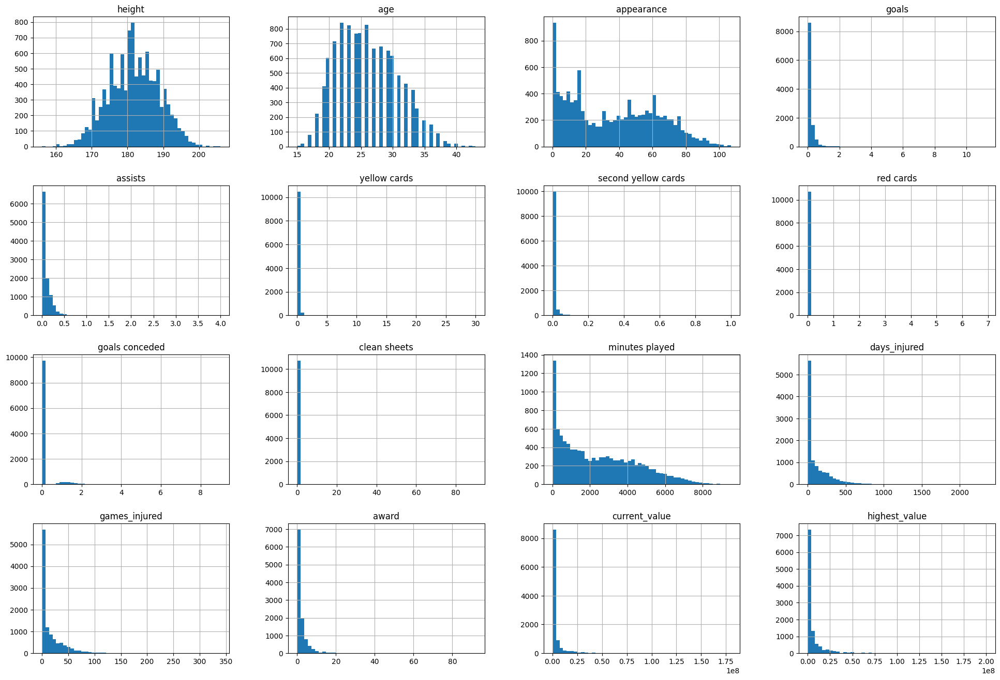

In [13]:
# histogram
df.hist(bins=50, figsize=(24, 16))
plt.show()

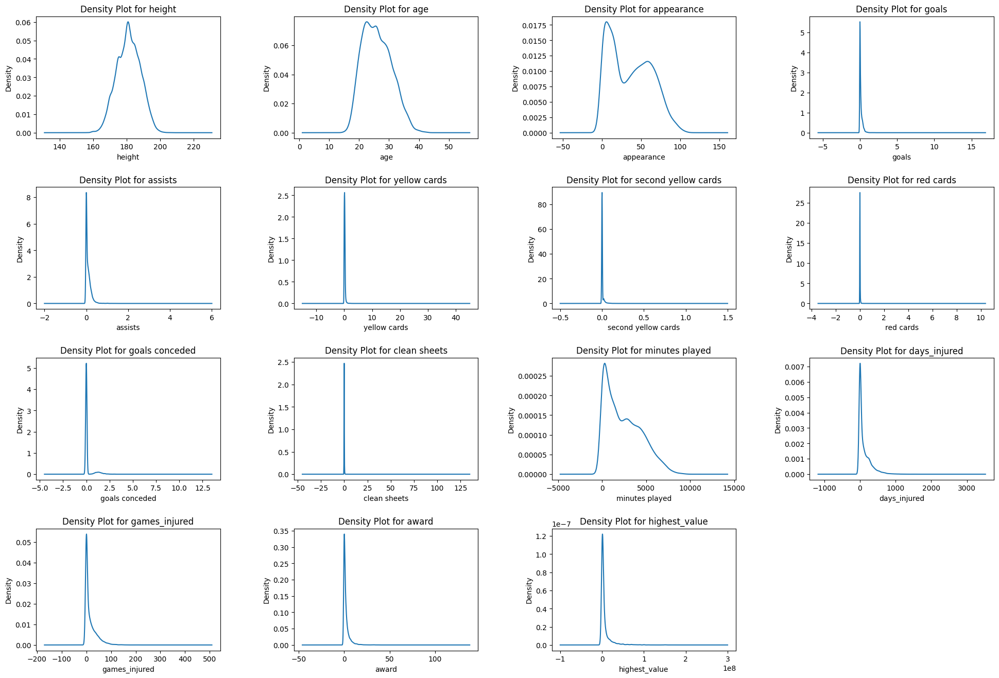

In [14]:
# Density
n_features = len(numerical_features)
n_cols = 4
n_rows = n_features // n_cols + (n_features % n_cols > 0)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, 4 * n_rows))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, feature in enumerate(numerical_features):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        ax = axs[row, col]
    else:
        ax = axs[col]
    df[feature].plot(kind='density', ax=ax)
    ax.set_title(f'Density Plot for {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')

for i in range(n_features, n_rows * n_cols):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        axs[row, col].axis('off')
    else:
        axs[col].axis('off')

plt.show()

Getting the distribution of categorical features:

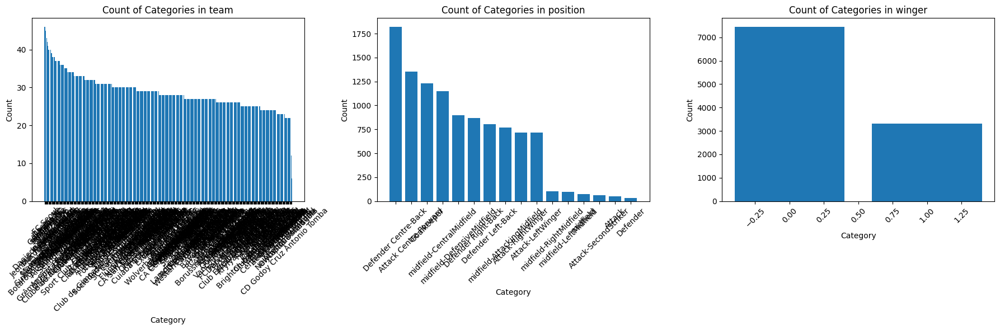

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

for i, feature in enumerate(categorical_features):
    value_counts = df[feature].value_counts()
    axes[i].bar(value_counts.index, value_counts.values)
    axes[i].set_title(f'Count of Categories in {feature}')
    axes[i].set_xlabel('Category')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=45) # Rotate labels to make them readable

plt.tight_layout()
plt.show()

## **Pairwise Relationships Analysis**

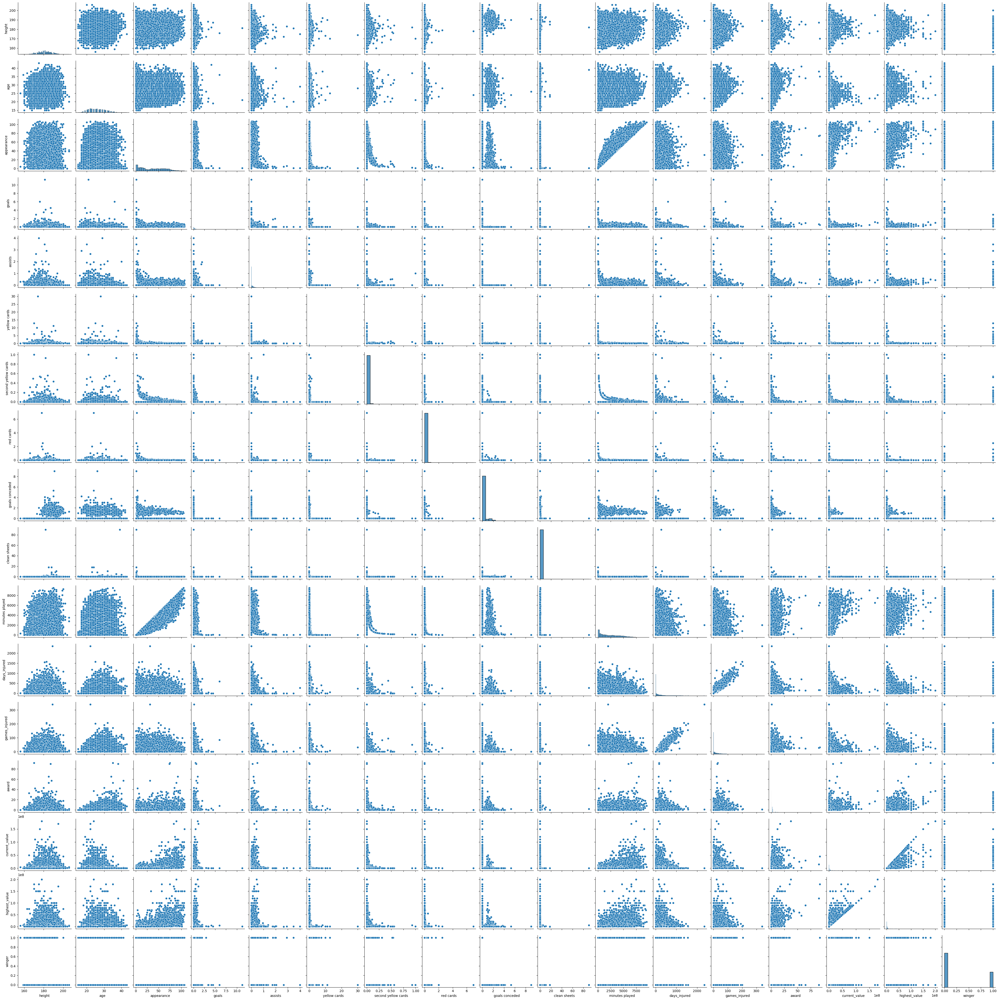

In [16]:
#Check for correlation between attributes using sns.pairplot.
sns.pairplot(df)

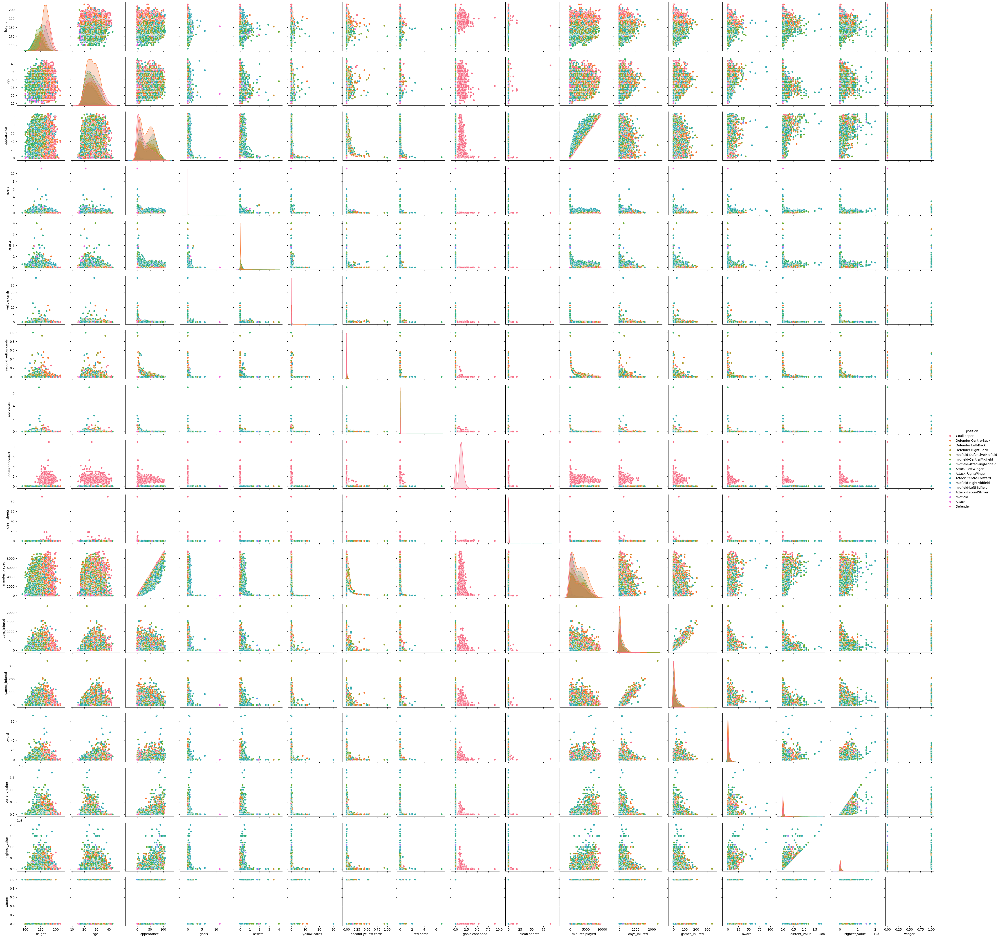

In [15]:
sns.pairplot(df, hue='position')
plt.show()

## **Correlation Analysis**

In [17]:
corr_matrix = df.corr(numeric_only=True)
corr_matrix

,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,winger
height,1.000000,0.063652,0.060641,-0.055962,-0.202441,-0.037974,-0.005112,-0.005693,0.333092,0.044366,0.132887,0.059392,0.054902,0.013976,0.040535,0.036776,-0.381728
age,0.063652,1.000000,0.139846,-0.034805,-0.024156,0.007085,0.015529,0.003074,0.083343,0.039064,0.169020,0.324267,0.343029,0.363478,-0.050156,0.123468,-0.047808
appearance,0.060641,0.139846,1.000000,0.131469,0.157186,-0.023092,-0.007436,-0.024514,-0.101384,-0.032515,0.945365,0.127369,0.147528,0.222139,0.419656,0.418394,0.038713
goals,-0.055962,-0.034805,0.131469,1.000000,0.218266,-0.012826,-0.013974,-0.013940,-0.158107,-0.025811,0.050863,0.037527,0.041696,0.099617,0.121574,0.129037,-0.004581
assists,-0.202441,-0.024156,0.157186,0.218266,1.000000,-0.004430,0.019551,-0.013189,-0.180607,-0.029460,0.081136,0.039431,0.049383,0.091569,0.137415,0.145407,0.177580
yellow cards,-0.037974,0.007085,-0.023092,-0.012826,-0.004430,1.000000,0.028739,-0.003007,-0.093675,-0.017122,-0.039652,0.011461,0.012892,-0.009052,-0.011766,-0.009772,0.010097
second yellow cards,-0.005112,0.015529,-0.007436,-0.013974,0.019551,0.028739,1.000000,-0.002562,-0.045840,-0.006770,-0.010411,0.003772,0.007090,-0.015231,-0.013889,-0.014155,-0.007259
red cards,-0.005693,0.003074,-0.024514,-0.013940,-0.013189,-0.003007,-0.002562,1.000000,-0.004584,-0.001778,-0.024402,-0.003650,-0.004764,-0.007886,-0.010171,-0.007257,-0.007026
goals conceded,0.333092,0.083343,-0.101384,-0.158107,-0.180607,-0.093675,-0.045840,-0.004584,1.000000,0.067466,-0.004267,-0.030926,-0.042140,-0.011520,-0.063529,-0.061183,-0.198351
clean sheets,0.044366,0.039064,-0.032515,-0.025811,-0.029460,-0.017122,-0.006770,-0.001778,0.067466,1.000000,-0.020190,0.001275,0.005611,0.002996,-0.011684,-0.008302,-0.032354


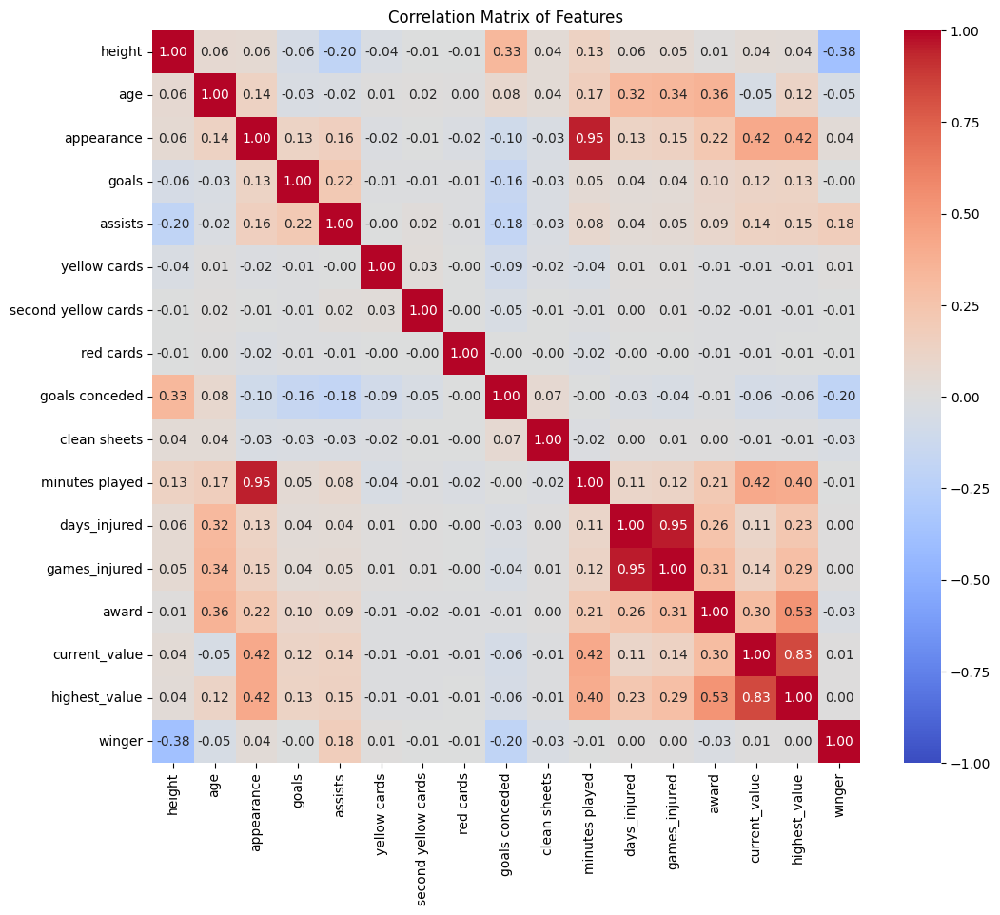

In [18]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix of Features")
plt.show()

## **PCA**

In [80]:
pca = PCA(n_components=15)

principal_components = pca.fit_transform(df[numerical_features])

df_pca = pd.DataFrame(data=principal_components, columns=[f'Principal Component {i}' for i in range(principal_components.shape[1])])
df_pca

,Principal Component 0,Principal Component 1,Principal Component 2,Principal Component 3,Principal Component 4,Principal Component 5,Principal Component 6,Principal Component 7,Principal Component 8,Principal Component 9,Principal Component 10,Principal Component 11,Principal Component 12,Principal Component 13,Principal Component 14
0,6.384739e+07,-3068.590292,-279.437816,-23.168463,6.241882,-2.472765,4.771515,1.292133,0.261301,-0.376020,0.685634,-0.079895,-0.066535,-0.002572,0.001025
1,1.584739e+07,2122.178416,348.153213,-14.993563,7.365283,10.835023,0.352446,-3.767517,0.050518,-0.412469,0.655791,-0.025682,0.006000,-0.008442,-0.002376
2,-1.526061e+05,2168.957026,586.740421,-10.033623,2.655625,3.463799,6.604964,-1.708558,0.745655,-0.286607,0.137293,-0.053532,-0.016345,-0.010184,-0.004620
3,4.384739e+07,-1292.989709,-80.712288,-3.259324,6.602201,-8.797057,-1.735844,1.889440,0.052909,0.056327,0.064073,-0.182346,-0.086941,-0.005438,-0.002398
4,7.384739e+07,1893.417176,-102.993948,-13.401064,-13.600779,3.485294,2.118164,6.868489,-0.134443,0.039703,-0.274458,-0.258688,-0.092446,-0.006665,-0.002650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,-6.077606e+06,1081.546897,-98.615051,-1.886440,0.996511,0.260131,-4.562475,0.931922,-0.032435,0.131865,-0.108765,0.061017,0.006495,-0.007339,-0.004728
10750,-5.852606e+06,668.871360,3.589257,-0.572493,-5.120269,9.198359,-2.439643,-0.575329,-0.101735,0.103872,-0.257944,0.245578,0.094375,-0.005142,-0.005841
10751,-6.102606e+06,1142.986089,-98.443423,2.576775,1.245662,2.078416,-5.116314,1.237738,-0.006653,0.030733,-0.096849,0.213175,-0.118578,-0.007260,-0.003619
10752,-6.102606e+06,1238.015068,-98.300727,0.789063,1.052553,1.404539,-4.299498,0.894774,-0.021964,-0.127937,-0.198657,0.173114,-0.003965,0.097004,-0.004004


In [81]:
overall_df_pca = pd.concat([df_pca, df[categorical_features + ["current_value"]]], axis=1)
overall_df_pca

,Principal Component 0,Principal Component 1,Principal Component 2,Principal Component 3,Principal Component 4,Principal Component 5,Principal Component 6,Principal Component 7,Principal Component 8,Principal Component 9,Principal Component 10,Principal Component 11,Principal Component 12,Principal Component 13,Principal Component 14,team,position,winger,current_value
0,6.384739e+07,-3068.590292,-279.437816,-23.168463,6.241882,-2.472765,4.771515,1.292133,0.261301,-0.376020,0.685634,-0.079895,-0.066535,-0.002572,0.001025,Manchester United,Goalkeeper,0,15000000
1,1.584739e+07,2122.178416,348.153213,-14.993563,7.365283,10.835023,0.352446,-3.767517,0.050518,-0.412469,0.655791,-0.025682,0.006000,-0.008442,-0.002376,Manchester United,Goalkeeper,0,1500000
2,-1.526061e+05,2168.957026,586.740421,-10.033623,2.655625,3.463799,6.604964,-1.708558,0.745655,-0.286607,0.137293,-0.053532,-0.016345,-0.010184,-0.004620,Manchester United,Goalkeeper,0,600000
3,4.384739e+07,-1292.989709,-80.712288,-3.259324,6.602201,-8.797057,-1.735844,1.889440,0.052909,0.056327,0.064073,-0.182346,-0.086941,-0.005438,-0.002398,Manchester United,Defender Centre-Back,0,50000000
4,7.384739e+07,1893.417176,-102.993948,-13.401064,-13.600779,3.485294,2.118164,6.868489,-0.134443,0.039703,-0.274458,-0.258688,-0.092446,-0.006665,-0.002650,Manchester United,Defender Centre-Back,0,40000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,-6.077606e+06,1081.546897,-98.615051,-1.886440,0.996511,0.260131,-4.562475,0.931922,-0.032435,0.131865,-0.108765,0.061017,0.006495,-0.007339,-0.004728,Western Sydney Wanderers,Attack-RightWinger,1,75000
10750,-5.852606e+06,668.871360,3.589257,-0.572493,-5.120269,9.198359,-2.439643,-0.575329,-0.101735,0.103872,-0.257944,0.245578,0.094375,-0.005142,-0.005841,Western Sydney Wanderers,Attack Centre-Forward,0,300000
10751,-6.102606e+06,1142.986089,-98.443423,2.576775,1.245662,2.078416,-5.116314,1.237738,-0.006653,0.030733,-0.096849,0.213175,-0.118578,-0.007260,-0.003619,Western Sydney Wanderers,Attack Centre-Forward,0,50000
10752,-6.102606e+06,1238.015068,-98.300727,0.789063,1.052553,1.404539,-4.299498,0.894774,-0.021964,-0.127937,-0.198657,0.173114,-0.003965,0.097004,-0.004004,Western Sydney Wanderers,Attack Centre-Forward,0,50000


# **Data Preprocessing**

In [98]:
# team_map = {0: False, 1: True}
# df["winger"] = df["winger"].replace(team_map)

In [217]:
df = df.drop(['days_injured', 'appearance', 'winger'], axis=1)

In [218]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

In [219]:
df.isna().sum()

team                   0
position               0
height                 0
age                    0
goals                  0
assists                0
yellow cards           0
second yellow cards    0
red cards              0
goals conceded         0
clean sheets           0
minutes played         0
games_injured          0
award                  0
current_value          0
highest_value          0
dtype: int64

In [220]:
num_cols = df.select_dtypes(include='number').columns.to_list()
num_cols.remove("current_value")  # Exclude the target from numerical columns

# Select categorical columns
cat_cols = df.select_dtypes(exclude='number').columns.to_list()

# Create pipelines for numeric and categorical columns
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OrdinalEncoder())

# Use ColumnTransformer to set the estimators and transformations
preprocessing = ColumnTransformer(
    [('num', num_pipeline, num_cols),
     ('cat', cat_pipeline, cat_cols)],
)

In [201]:
preprocessing

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['height', 'age', 'appearance', 'goals',
                                  'assists', 'yellow cards',
                                  'second yellow cards', 'red cards',
                                  'goals conceded', 'clean sheets',
                                  'minutes played', 'days_injured',
                                  'games_injured', 'award', 'highest_value',
                                  'winger']),
                                ('cat',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder())]),
                                 ['team', 'position'])])

In [221]:
df_prepared = preprocessing.fit_transform(df)
feature_names=preprocessing.get_feature_names_out()
df_prepared = pd.DataFrame(data=df_prepared, columns=feature_names)
df_prepared

,num__height,num__age,num__goals,num__assists,num__yellow cards,num__second yellow cards,num__red cards,num__goals conceded,num__clean sheets,num__minutes played,num__games_injured,num__award,num__highest_value,cat__team,cat__position
0,1.113373e+00,1.247140,-0.532971,-0.606773,-0.416711,-0.184919,-0.084128,2.454353,0.314349,3.422625,-0.463008,2.948703,4.768555,226.0,9.0
1,2.117750e+00,0.828503,-0.532971,-0.606773,-0.279250,-0.184919,-0.084128,2.511052,0.175438,-0.577159,1.803642,-0.256629,1.183591,226.0,9.0
2,9.698906e-01,2.293733,-0.532971,-0.606773,-0.438879,-0.184919,-0.084128,1.096013,0.951733,-1.077750,2.915584,0.544704,-0.011398,226.0,9.0
3,-8.953810e-01,-0.218090,-0.413731,-0.214852,0.080861,-0.184919,-0.084128,-0.297651,-0.048552,1.947563,0.264031,1.880259,3.274820,226.0,6.0
4,1.400338e+00,0.828503,-0.457033,-0.481975,-0.314755,-0.184919,-0.084128,-0.297651,-0.048552,1.266422,1.504273,5.085590,5.515423,226.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,-2.527020e-09,-1.264683,0.213940,0.006968,0.171549,-0.184919,-0.084128,-0.297651,-0.048552,-0.716157,-0.676843,-0.523740,-0.453917,365.0,3.0
10750,1.256856e+00,-0.427408,1.048996,0.693139,-0.007914,-0.184919,-0.084128,-0.297651,-0.048552,-0.505434,0.092963,-0.523740,-0.437112,365.0,1.0
10751,-2.527020e-09,-1.474001,1.058884,-0.606773,-0.005221,-0.184919,-0.084128,-0.297651,-0.048552,-0.747320,-0.676843,-0.523740,-0.455784,365.0,1.0
10752,-2.527020e-09,-1.264683,0.792041,0.119074,-0.438879,-0.184919,1.198195,-0.297651,-0.048552,-0.794312,-0.676843,-0.523740,-0.455784,365.0,1.0


In [222]:
X = df_prepared[feature_names]
Y = df["current_value"] / 1_000_000
feature_names

array(['num__height', 'num__age', 'num__goals', 'num__assists',
       'num__yellow cards', 'num__second yellow cards', 'num__red cards',
       'num__goals conceded', 'num__clean sheets', 'num__minutes played',
       'num__games_injured', 'num__award', 'num__highest_value',
       'cat__team', 'cat__position'], dtype=object)

# **TRAINING MODELS**

In [270]:
X_train_temp, X_temp, Y_train_temp, Y_temp = train_test_split(X, Y, test_size=0.2, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

## **Linear/Polynomial Regression**

In [271]:
model = LinearRegression()
model.fit(X_train_temp, Y_train_temp)
model.score(X_train_temp, Y_train_temp)

0.748146485434106

In [272]:
val_predictions = model.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

4.526594912435834

In [273]:
test_predictions = model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

4.939227368560757

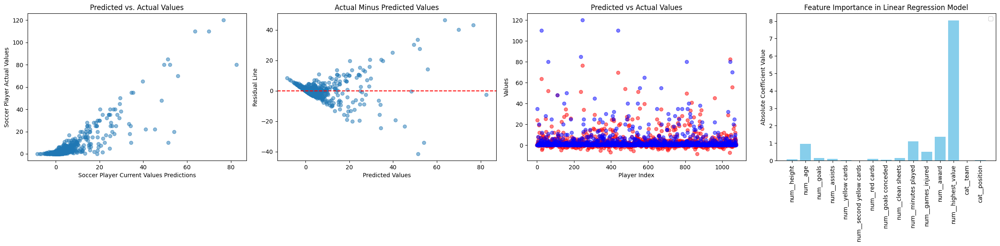

In [274]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# index of player and value in dollars
# 2 colours: orange is actual value, blue is predicted value

axes[2].scatter(range(len(test_predictions)), test_predictions, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')

coefficients = model.coef_

# Step 3: Create the plot
indices = np.arange(len(coefficients))
axes[3].bar(indices, np.abs(coefficients), color='skyblue')
axes[3].set_xticks(indices, feature_names, rotation='vertical')
axes[3].set_ylabel('Absolute Coefficient Value')
axes[3].set_title('Feature Importance in Linear Regression Model')

plt.legend()

plt.tight_layout()
plt.show()

In [295]:
poly = PolynomialFeatures(degree=2, include_bias=True)
poly_features = poly.fit_transform(X_train_temp)

In [296]:
model = LinearRegression()
model.fit(poly_features, Y_train_temp)

LinearRegression()

In [297]:
poly_features_val = poly.fit_transform(X_val)
val_predictions = model.predict(poly_features_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

2.3475338467898705

In [299]:
poly_features_test = poly.fit_transform(X_test)
test_predictions = model.predict(poly_features_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

3.1502496774526474

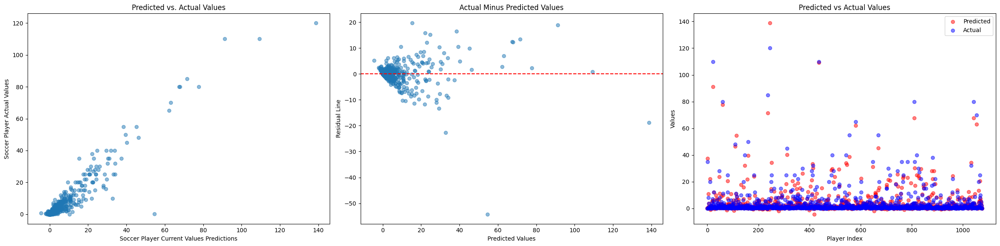

In [301]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# index of player and value in dollars
# 2 colours: orange is actual value, blue is predicted value

axes[2].scatter(range(len(test_predictions)), test_predictions, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')

plt.legend()

plt.tight_layout()
plt.show()

## **Random Forest Regression**

In [226]:
rf = RandomForestRegressor()
rf.fit(X_train_temp, Y_train_temp)
rf.score(X_train_temp, Y_train_temp)

0.9856545907575744

In [227]:
val_predictions = rf.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

2.5286049859966218

In [228]:
test_predictions = rf.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

3.2572447880380047

In [168]:
rf = RandomForestRegressor()

param_grid = {
    'n_estimators': [25, 50, 100, 200, 300, 400],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='r2', cv=5)

grid_search.fit(X_train_temp, Y_train_temp)

best_model = grid_search.best_estimator_

best_model_score = best_model.score(X_val, Y_val)

In [302]:
best_parameters = grid_search.best_params_
best_parameters

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}

In [303]:
val_predictions = best_model.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

2.4286966876482947

In [304]:
test_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

3.183803663799982

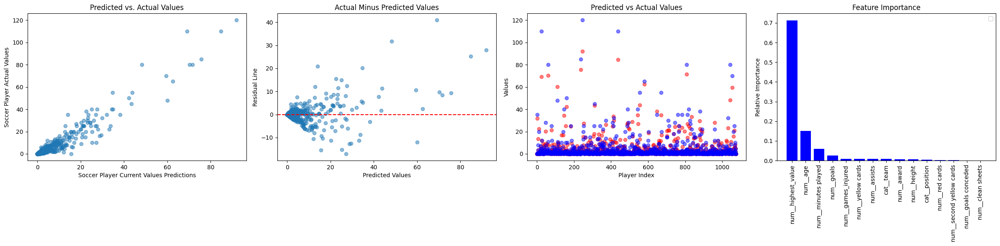

In [306]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# index of player and value in dollars
# 2 colours: orange is actual value, blue is predicted value

axes[2].scatter(range(len(test_predictions)), test_predictions, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')

# Step 3: Create the plot
importances = best_model.feature_importances_
indices = np.argsort(importances)[::-1]
names = [X.columns[i] for i in indices]

axes[3].bar(range(X.shape[1]), importances[indices], color="b", align="center")
axes[3].set_xticks(range(X.shape[1]))
axes[3].set_xticklabels(names, rotation=90)
axes[3].set_title('Feature Importance')
axes[3].set_ylabel('Relative Importance')


plt.legend()

plt.tight_layout()
plt.show()

## **Neural Network**

In [262]:
model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_temp.shape[1],)),

    Dense(128, activation='relu'),

    Dense(64, activation='relu'),

    Dense(1, activation='linear')
])
model.compile(optimizer='adam', loss='mean_squared_error')

In [264]:
# early_stopping = EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='min', restore_best_weights=True)
history = model.fit(X_train_temp, Y_train_temp, epochs=500, validation_data=(X_val, Y_val), verbose=1, callbacks=[early_stopping], batch_size=32)
# history = model.fit(X_train_temp, Y_train_temp, epochs=500, validation_data=(X_val, Y_val), verbose=1, batch_size=32)

model.save('nn.h5')

Epoch 1/500
269/269 [==============================] - 2s 4ms/step - loss: 64.5952 - val_loss: 23.0748
Epoch 2/500
269/269 [==============================] - 1s 3ms/step - loss: 24.4449 - val_loss: 14.6666
Epoch 3/500
269/269 [==============================] - 1s 4ms/step - loss: 18.5175 - val_loss: 17.5558
Epoch 4/500
269/269 [==============================] - 1s 5ms/step - loss: 17.5439 - val_loss: 12.7698
Epoch 5/500
269/269 [==============================] - 1s 4ms/step - loss: 14.0468 - val_loss: 14.4809
Epoch 6/500
269/269 [==============================] - 1s 3ms/step - loss: 12.1123 - val_loss: 14.2814
Epoch 7/500
269/269 [==============================] - 1s 3ms/step - loss: 12.8073 - val_loss: 14.7427
Epoch 8/500
269/269 [==============================] - 1s 3ms/step - loss: 14.0589 - val_loss: 10.2197
Epoch 9/500
269/269 [==============================] - 1s 3ms/step - loss: 11.7168 - val_loss: 10.8624
Epoch 10/500
269/269 [==============================] - 1s 3ms/step - los

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [265]:
model_nn = tf.keras.models.load_model('nn.h5')

In [266]:
val_predictions = model_nn.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

34/34 [==============================] - 0s 2ms/step


2.4492647666227203

In [267]:
test_predictions = model_nn.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

34/34 [==============================] - 0s 1ms/step


3.0306500971576367

34/34 [==============================] - 0s 2ms/step


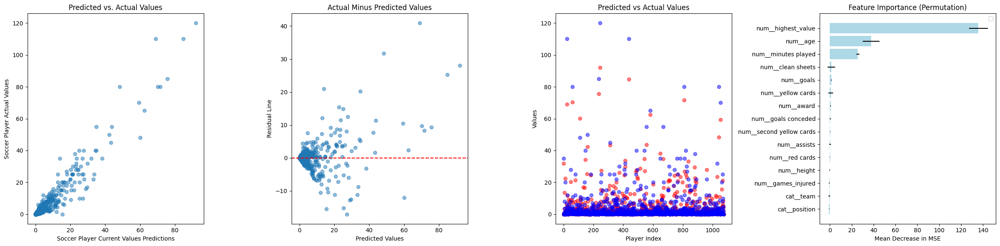

In [312]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# index of player and value in dollars
# 2 colours: orange is actual value, blue is predicted value

axes[2].scatter(range(len(test_predictions)), test_predictions, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')


def predict_model(X):
    return model.predict(X).flatten()

# Calculate permutation feature importance
results = permutation_importance(model_nn, X_test, Y_test, n_repeats=10, random_state=42, scoring='neg_mean_squared_error')

# Extract the importances and standard deviations
importances = results.importances_mean
importance_std = results.importances_std

# Sort the features by importance
sorted_idx = np.argsort(importances)

# Creating the plot
axes[3].barh(range(X_test.shape[1]), importances[sorted_idx], xerr=importance_std[sorted_idx], color='lightblue', align='center')
axes[3].set_yticks(range(X_test.shape[1]))
axes[3].set_yticklabels(X_test.columns[sorted_idx])
axes[3].set_title('Feature Importance (Permutation)')
axes[3].set_xlabel('Mean Decrease in MSE')

plt.legend()

plt.tight_layout()
plt.show()